<a href="https://colab.research.google.com/github/bnsreenu/python_for_microscopists/blob/master/334_training_YOLO_V8_EM_platelets_converted_labels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://youtu.be/ytlhMAF6ok0

# **Custom instance model training using YOLOv8**
<p>
This code walks you through the process of training a custom YOLO v8 model using your own data. Here, I am using a public dataset that shows multiple classes for segmentation. This is the same dataset from tutorial 330 (Detectron2) - https://youtu.be/cEgF0YknpZw

<p>
Dataset from: https://leapmanlab.github.io/dense-cell/
<br>
Direct link to the dataset: https://www.dropbox.com/s/68yclbraqq1diza/platelet_data_1219.zip

**Data courtesy of:**
Guay, M.D., Emam, Z.A.S., Anderson, A.B. et al. ​
Dense cellular segmentation for EM using 2D–3D neural network ensembles. Sci Rep 11, 2561 (2021). ​
<p>
To prepare this dataset for YOLO, the binary masks were converted to the YOLO format. Please follow this tutorial to learn about this process. <br>
(https://youtu.be/NYeJvxe5nYw)

<p>

If you already have annotations in COCO format JSON file, for example by annotating using makesense (https://www.makesense.ai/) then the annotations can be imported to Roboflow for conversion to YOLO format. Otherwise, if you are starting from scratch, just annotate datasets on Roboflow. (https://roboflow.com/). You just need to upload your images along with the JSON file and Roboflow will convert them to any other format, in our case YOLO v8. <p>

For information about YOLO models: <p>
https://docs.ultralytics.com/models/yolov8/#key-features
<p>


# Nouvelle section

**Install the required libraries:**

Let us start by installing ultralytics library. All other libraries should be pre-installed on colab. If you are working on a local system, please make sure you install matplotlib, Pillow, numpy, Seaborn, and roboflow. You may also want to install pandas and other libraries depending on the task.

In [ ]:
# Install the ultralytics package using pip
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 4.2 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

**Import a model and populate it with pre-trained weights.**
<p>
Here, we are importing an instance segmentation model with weights. For a list of pre-trained models, checkout: https://docs.ultralytics.com/models/yolov8/#key-features

In [ ]:
#Instance
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training)

100%|██████████| 6.73M/6.73M [00:00<00:00, 83.4MB/s]


**Install Roboflow**
<p>
to directly read our training data. For colab, we are going to find a workaround to handle encoding issues by the platform. In fact, we may encounter encoding issues for other tasks in Colab so let's go ahead and run the following cell.  

In [ ]:
#Withut this Colab is giving an error when installing Roboflow
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In case your annotations are on Roboflow, you can directly import the training data using your API key

In [ ]:
#!pip install roboflow --quiet
#%cd /content/

In [ ]:
# To hide your API key from others, you can use getpass
#from getpass import getpass
#token = getpass('Enter Token Here') #I stored my token in a file on my Google Drive. I will enter it when prompted here.

In [ ]:
# Import your data from Roboflow
"""
from roboflow import Roboflow
rf = Roboflow(api_key=token)
project = rf.workspace("python-for-microscopists-nceyk").project("3d-em-platelet")
dataset = project.version(2).download("yolov8")
"""
#Change the working directory to the downloaded data directory and check the yaml file.
#%cd /content/your_dataset

'\nfrom roboflow import Roboflow\nrf = Roboflow(api_key=token)\nproject = rf.workspace("python-for-microscopists-nceyk").project("3d-em-platelet")\ndataset = project.version(2).download("yolov8")\n'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Let us load the YAML file that contains the names of our classes, number of classes and the directories for train, valid, and test datasets, respectively.

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/drive/MyDrive/segmentation.v1i.yolov8/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['cell']

roboflow:
  workspace: khadidja
  project: segmentation-rh5hj
  version: 1
  license: Public Domain
  url: https://universe.roboflow.com/khadidja/segmentation-rh5hj/dataset/1

In [ ]:
# define number of classes based on YAML
import yaml
with open("/content/drive/MyDrive/segmentation.v1i.yolov8/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

**Train the model**

In [ ]:
#Define a project --> Destination directory for all results
project = "/content/drive/MyDrive/segmentation.v1i.yolov8/results"
#Define subdirectory for this specific training
name = "200_epochs-" #note that if you run the training again, it creates a directory: 200_epochs-2

In [ ]:
# Train the model
results = model.train(data='/content/drive/MyDrive/segmentation.v1i.yolov8/data.yaml',
                      project=project,
                      name=name,
                      epochs=100,
                      patience=0, #I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=800)

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/segmentation.v1i.yolov8/data.yaml, epochs=100, time=None, patience=0, batch=4, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/segmentation.v1i.yolov8/results, name=200_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, sa

100%|██████████| 755k/755k [00:00<00:00, 22.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 110MB/s]


WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/segmentation.v1i.yolov8/train/labels... 81 images, 0 backgrounds, 0 corrupt: 100%|██████████| 81/81 [01:06<00:00,  1.22it/s]

train: WARNING ⚠️ /content/drive/MyDrive/segmentation.v1i.yolov8/train/images/im-196-_png.rf.722f5249d8e2dddea358c2bfb09e2644.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/segmentation.v1i.yolov8/train/images/im-98-_png.rf.8ab44995641628a351e87a26292452b6.jpg: 1 duplicate labels removed
train: New cache created: /content/drive/MyDrive/segmentation.v1i.yolov8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/segmentation.v1i.yolov8/valid/labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:23<00:00,  1.22it/s]

val: WARNING ⚠️ /content/drive/MyDrive/segmentation.v1i.yolov8/valid/images/im-202-_png.rf.564aaa4e0ae9ca797cb61628eddeecc3.jpg: 1 duplicate labels removed
val: New cache created: /content/drive/MyDrive/segmentation.v1i.yolov8/valid/labels.cache


Plotting labels to /content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.27G      1.036      1.551      2.988      0.983         30        800: 100%|██████████| 21/21 [00:21<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]

                   all         29        772      0.076      0.856      0.159       0.11     0.0754       0.85      0.168      0.128



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100       4.3G     0.9063      1.233       1.26     0.9128         53        800: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all         29        772      0.967      0.799      0.849       0.64      0.967      0.799      0.845      0.643



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.73G     0.8674      1.127       0.87     0.9257         28        800: 100%|██████████| 21/21 [00:10<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.56it/s]

                   all         29        772      0.969      0.846      0.882      0.689      0.963      0.842      0.874      0.607



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100       5.5G     0.8205      1.165     0.8254     0.9043         27        800: 100%|██████████| 21/21 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all         29        772      0.948      0.872      0.905      0.703      0.946       0.87        0.9      0.669



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.19G     0.9508      1.135     0.8892     0.9259         72        800: 100%|██████████| 21/21 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all         29        772      0.933      0.866      0.913      0.692      0.926      0.873       0.91      0.666



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.04G     0.8675      1.243     0.8543     0.9216         26        800: 100%|██████████| 21/21 [00:12<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all         29        772      0.946      0.855      0.906       0.74       0.95      0.855      0.908      0.697



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.49G     0.8581       1.18     0.8175     0.9187         18        800: 100%|██████████| 21/21 [00:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all         29        772       0.95      0.854       0.91       0.69      0.951      0.857      0.909      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.09G      0.869      1.097     0.8056     0.9141         70        800: 100%|██████████| 21/21 [00:11<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all         29        772      0.953      0.868      0.937      0.702      0.954      0.868      0.932      0.705



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.23G     0.8729      1.092     0.8085       0.91        110        800: 100%|██████████| 21/21 [00:11<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all         29        772      0.947      0.873      0.937       0.74      0.945      0.871      0.932      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.97G     0.8096      1.012     0.7729     0.9112         70        800: 100%|██████████| 21/21 [00:09<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all         29        772      0.944      0.876      0.942      0.718      0.947       0.87      0.938       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.69G     0.7865      1.068     0.7567     0.9104         39        800: 100%|██████████| 21/21 [00:09<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.59it/s]

                   all         29        772      0.951      0.883      0.946      0.772      0.948      0.877      0.941      0.747



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.18G     0.7638      1.033     0.7389     0.9096         20        800: 100%|██████████| 21/21 [00:10<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]


                   all         29        772      0.955      0.894      0.951      0.777       0.95       0.89      0.946      0.754

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.21G     0.7482      1.058     0.7065     0.9055         44        800: 100%|██████████| 21/21 [00:11<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all         29        772      0.941      0.908      0.956      0.787      0.943      0.909      0.955      0.777



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.45G     0.7077     0.9327     0.6782     0.8792         56        800: 100%|██████████| 21/21 [00:12<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all         29        772       0.92      0.927      0.956      0.802      0.918      0.925      0.953      0.763



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.58G       0.69      1.085     0.6824     0.8779         26        800: 100%|██████████| 21/21 [00:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all         29        772       0.95      0.894      0.959      0.803      0.948      0.889      0.958      0.764



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.05G     0.6785       1.08     0.6644     0.8713         14        800: 100%|██████████| 21/21 [00:11<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all         29        772      0.921      0.933      0.962      0.811      0.916      0.931       0.96      0.768



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100       6.9G     0.6999      1.032     0.6739     0.8766         18        800: 100%|██████████| 21/21 [00:11<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]

                   all         29        772      0.926      0.935      0.965      0.804      0.924      0.931      0.962      0.788



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.88G      0.714      1.034     0.6669     0.8809         28        800: 100%|██████████| 21/21 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.27it/s]

                   all         29        772      0.933      0.931      0.959      0.805      0.929      0.927      0.953      0.747



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.59G      0.695      0.994     0.6702     0.8816         25        800: 100%|██████████| 21/21 [00:09<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all         29        772      0.934       0.92      0.956      0.802       0.93      0.916      0.952      0.754



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.36G     0.6799      1.003     0.6485     0.8822         73        800: 100%|██████████| 21/21 [00:11<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]

                   all         29        772      0.917      0.926      0.954      0.806      0.917      0.925      0.953      0.769



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.76G     0.6773      1.015     0.6598     0.8741         36        800: 100%|██████████| 21/21 [00:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all         29        772      0.935      0.897      0.955      0.801      0.936      0.896      0.945      0.747



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.08G      0.694      1.124     0.6178     0.8771         23        800: 100%|██████████| 21/21 [00:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all         29        772      0.927      0.922      0.955      0.788      0.939      0.915      0.948       0.74



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.24G     0.7071      1.185     0.6339     0.8833         57        800: 100%|██████████| 21/21 [00:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all         29        772      0.949      0.911      0.956      0.794      0.945      0.907      0.949      0.752



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.71G     0.7462      1.043     0.6417     0.8894         69        800: 100%|██████████| 21/21 [00:09<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all         29        772      0.954      0.917      0.967        0.8      0.941      0.924      0.962      0.773



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100       4.7G      0.732      1.117     0.6303     0.8931         16        800: 100%|██████████| 21/21 [00:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all         29        772       0.95      0.922      0.968      0.807      0.947       0.92      0.962      0.776



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.19G     0.6812     0.9895     0.6027     0.8699         54        800: 100%|██████████| 21/21 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all         29        772      0.954      0.922      0.969      0.805      0.951       0.92      0.961      0.784



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.61G      0.682     0.9559     0.5769     0.8672         53        800: 100%|██████████| 21/21 [00:11<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         29        772      0.951      0.922      0.964      0.815      0.944      0.929       0.96      0.772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.74G     0.6464     0.9757     0.5746     0.8737         20        800: 100%|██████████| 21/21 [00:11<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all         29        772       0.96      0.917      0.963      0.825      0.953      0.918      0.959      0.778



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.78G     0.6363     0.8888     0.5678     0.8659         12        800: 100%|██████████| 21/21 [00:11<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all         29        772      0.953      0.921      0.967       0.82      0.947      0.921      0.961      0.789



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.74G     0.6824      1.059     0.6132     0.8821         10        800: 100%|██████████| 21/21 [00:10<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all         29        772      0.939      0.932      0.964      0.822      0.936      0.929      0.961      0.768



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100       5.6G     0.6861      1.028     0.5846     0.8952         22        800: 100%|██████████| 21/21 [00:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all         29        772      0.915      0.945      0.965      0.814      0.915      0.945      0.961      0.791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.52G     0.6773      1.016     0.5599     0.8745         20        800: 100%|██████████| 21/21 [00:10<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all         29        772      0.935      0.936      0.963       0.82      0.931      0.939      0.961      0.787



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.29G     0.6828     0.9912     0.5932     0.8862         46        800: 100%|██████████| 21/21 [00:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]


                   all         29        772      0.934      0.946      0.964      0.827       0.93      0.942      0.961      0.774

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.15G     0.7531      1.022     0.5967     0.8875         61        800: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all         29        772      0.938      0.937      0.962      0.773      0.935      0.934       0.96      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.89G      0.758      1.084     0.6063     0.8889         45        800: 100%|██████████| 21/21 [00:10<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]

                   all         29        772       0.95      0.918       0.96        0.8      0.949      0.916      0.957      0.748



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100       4.4G     0.6753     0.9982     0.6129     0.8756         59        800: 100%|██████████| 21/21 [00:09<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all         29        772      0.951      0.923      0.963       0.82      0.947      0.919      0.959      0.773



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.22G     0.6637      1.043     0.5699     0.8665         64        800: 100%|██████████| 21/21 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all         29        772      0.924      0.945      0.961      0.814      0.931      0.939       0.96      0.785



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.05G     0.6469     0.9745     0.5632     0.8765         28        800: 100%|██████████| 21/21 [00:14<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all         29        772      0.937      0.931      0.959      0.813      0.937      0.931      0.957      0.774



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.81G     0.6732      1.009     0.5716     0.8705         95        800: 100%|██████████| 21/21 [00:11<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all         29        772      0.943      0.922      0.961      0.814      0.931      0.935      0.957       0.77



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.41G     0.6689     0.9992     0.5489     0.8841         13        800: 100%|██████████| 21/21 [00:10<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all         29        772      0.941      0.924      0.967      0.824       0.93       0.94      0.964      0.775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100       4.2G     0.6496     0.9732     0.5377     0.8714         15        800: 100%|██████████| 21/21 [00:09<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all         29        772      0.945      0.928      0.968      0.822      0.927       0.94      0.964      0.788



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100       6.8G     0.6492     0.9602     0.5433     0.8611         25        800: 100%|██████████| 21/21 [00:09<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all         29        772      0.937       0.93      0.969      0.825      0.927      0.931      0.964      0.785



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.26G     0.6232     0.9463     0.5212     0.8547         44        800: 100%|██████████| 21/21 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all         29        772      0.932      0.937       0.97      0.827      0.928      0.934      0.964      0.772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100       4.5G     0.6244     0.9504     0.5228      0.861         25        800: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all         29        772      0.935      0.937      0.969      0.815      0.931      0.938      0.964      0.772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.17G     0.6172     0.9342     0.5147      0.859         26        800: 100%|██████████| 21/21 [00:11<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all         29        772      0.943      0.935      0.972      0.824      0.939      0.931      0.964       0.77



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.77G     0.6077     0.9273     0.5078     0.8599         94        800: 100%|██████████| 21/21 [00:11<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all         29        772      0.943       0.93      0.969      0.826      0.939      0.926      0.961      0.783



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.05G     0.6263     0.9319     0.5092     0.8645         26        800: 100%|██████████| 21/21 [00:10<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all         29        772      0.934      0.941      0.968      0.823      0.932      0.939      0.961      0.779



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100       3.9G     0.6216      1.015     0.4992     0.8691         14        800: 100%|██████████| 21/21 [00:09<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.41it/s]

                   all         29        772      0.942      0.941      0.968      0.822      0.947      0.933      0.962       0.77



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.95G     0.6032     0.9113     0.4904     0.8603         16        800: 100%|██████████| 21/21 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]

                   all         29        772      0.949      0.934      0.969      0.824      0.941      0.935      0.962      0.768



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100       7.2G     0.6787      1.048     0.5258       0.87         85        800: 100%|██████████| 21/21 [00:12<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all         29        772      0.936      0.948      0.971      0.822      0.934      0.949      0.965       0.79



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.98G     0.6671       1.02     0.5298     0.8825         30        800: 100%|██████████| 21/21 [00:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]

                   all         29        772      0.932      0.947       0.97      0.826      0.933      0.949      0.965      0.794



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.74G     0.6318     0.9653     0.4964     0.8712         62        800: 100%|██████████| 21/21 [00:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all         29        772      0.931      0.945       0.97       0.82      0.931      0.945      0.963      0.768



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.27G     0.6789      1.041     0.5405     0.8681         32        800: 100%|██████████| 21/21 [00:11<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all         29        772      0.943      0.933      0.971      0.817       0.94       0.93      0.963      0.762



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100       3.5G      0.627     0.9216     0.5027     0.8599         38        800: 100%|██████████| 21/21 [00:09<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all         29        772      0.957       0.92      0.971      0.823      0.948       0.92      0.964      0.783



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.98G     0.6595      1.007     0.5161      0.882         18        800: 100%|██████████| 21/21 [00:09<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all         29        772      0.947      0.924      0.972      0.826      0.949      0.914      0.964      0.796



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100       4.4G     0.6101     0.9291     0.4905     0.8596         13        800: 100%|██████████| 21/21 [00:10<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all         29        772      0.948      0.929      0.966       0.82      0.941       0.93      0.962      0.778



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.76G     0.6154     0.9977     0.5041     0.8571         63        800: 100%|██████████| 21/21 [00:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all         29        772       0.94       0.94      0.968      0.819      0.952      0.925      0.961       0.77



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.91G     0.6213     0.8902     0.5001     0.8666         43        800: 100%|██████████| 21/21 [00:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all         29        772       0.95      0.926       0.97      0.825      0.949      0.924      0.963      0.775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.35G     0.6028     0.9501     0.4996     0.8606         64        800: 100%|██████████| 21/21 [00:11<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all         29        772      0.933      0.931      0.969      0.831      0.929      0.927      0.962      0.791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.28G     0.5912     0.9512      0.482     0.8596         25        800: 100%|██████████| 21/21 [00:09<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all         29        772      0.917      0.937      0.967      0.833      0.935      0.913      0.961       0.79



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.78G     0.6066     0.9092     0.4876     0.8567         70        800: 100%|██████████| 21/21 [00:09<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.47it/s]

                   all         29        772      0.914      0.942      0.967      0.832      0.944       0.91      0.962      0.781



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100       6.3G     0.6191     0.9096     0.5026     0.8705         26        800: 100%|██████████| 21/21 [00:10<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all         29        772      0.957      0.913      0.971      0.826      0.944      0.912      0.964      0.761



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.16G     0.6129     0.9519     0.4696     0.8563         31        800: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all         29        772      0.955      0.915      0.972      0.833      0.956      0.913      0.966      0.775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.04G     0.5961      0.904     0.4612     0.8525         39        800: 100%|██████████| 21/21 [00:11<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]


                   all         29        772      0.952      0.921      0.973      0.834      0.954      0.917      0.967       0.79

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.28G     0.5979     0.8766     0.4602     0.8569         25        800: 100%|██████████| 21/21 [00:11<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all         29        772      0.923      0.953      0.974      0.837      0.926       0.95      0.971      0.791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.14G     0.6004     0.9132      0.477     0.8541         58        800: 100%|██████████| 21/21 [00:10<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all         29        772      0.938      0.938      0.973      0.834      0.934      0.934       0.97      0.776



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.07G     0.6054     0.8852     0.4601     0.8589         18        800: 100%|██████████| 21/21 [00:09<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.45it/s]

                   all         29        772       0.93      0.944      0.973      0.836      0.969      0.898      0.968      0.775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.98G     0.6005     0.8847     0.4697      0.854         86        800: 100%|██████████| 21/21 [00:09<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all         29        772      0.931      0.943      0.971      0.836      0.975      0.898      0.968      0.782



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.01G     0.5954     0.9308     0.4664     0.8639         23        800: 100%|██████████| 21/21 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all         29        772      0.941      0.935      0.973       0.84      0.939       0.93      0.969      0.791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.29G     0.6006      0.915     0.4726     0.8612         36        800: 100%|██████████| 21/21 [00:11<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]

                   all         29        772      0.936      0.942      0.974      0.837      0.932      0.938      0.967      0.782



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.77G     0.5887     0.8528     0.4626     0.8554         11        800: 100%|██████████| 21/21 [00:11<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all         29        772      0.933      0.941      0.972      0.835      0.929      0.938      0.965      0.778



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.87G     0.5851     0.9166      0.444     0.8549         22        800: 100%|██████████| 21/21 [00:11<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all         29        772      0.939      0.938       0.97      0.831      0.938      0.936      0.965      0.774



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.45G     0.5756     0.8549     0.4356     0.8396         32        800: 100%|██████████| 21/21 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all         29        772      0.929      0.944       0.97      0.831      0.933      0.934      0.966      0.779



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.65G      0.544     0.8357     0.4239     0.8515         21        800: 100%|██████████| 21/21 [00:09<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all         29        772      0.934       0.94      0.971      0.836      0.927      0.937      0.969      0.783



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100       5.9G     0.6038     0.9537     0.4481     0.8644         21        800: 100%|██████████| 21/21 [00:11<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         29        772      0.928      0.935       0.97      0.836      0.934      0.925      0.966      0.785



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.22G     0.6062     0.9495      0.452     0.8583         43        800: 100%|██████████| 21/21 [00:12<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all         29        772      0.939       0.93      0.969       0.83      0.938      0.925      0.965      0.778



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.05G     0.5665     0.8825      0.427     0.8513         19        800: 100%|██████████| 21/21 [00:11<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all         29        772      0.937       0.93      0.969      0.827      0.944      0.916      0.966      0.766



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.71G     0.6026     0.9314     0.4365      0.861         57        800: 100%|██████████| 21/21 [00:10<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all         29        772      0.947      0.917      0.971      0.834      0.959      0.902      0.965       0.77



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.35G     0.5642     0.8234     0.4359     0.8485         26        800: 100%|██████████| 21/21 [00:09<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]

                   all         29        772       0.96      0.905      0.971      0.837      0.958      0.902      0.968      0.778



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.95G     0.5771      0.942     0.4414     0.8643         31        800: 100%|██████████| 21/21 [00:09<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all         29        772      0.919      0.949      0.971      0.837      0.916      0.947      0.967      0.788



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.26G     0.5738     0.8852     0.4318     0.8472         42        800: 100%|██████████| 21/21 [00:11<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.70it/s]

                   all         29        772      0.917      0.947       0.97      0.834       0.91      0.945      0.965      0.793



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.96G     0.5786     0.8965     0.4465     0.8591         77        800: 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all         29        772      0.922      0.944      0.968      0.834       0.92      0.942      0.966      0.784



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.31G     0.5636     0.8754     0.4394     0.8514         46        800: 100%|██████████| 21/21 [00:11<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]

                   all         29        772      0.921      0.949      0.971      0.833      0.917      0.945      0.968      0.779



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.38G     0.6094      0.925     0.4749     0.8604          6        800: 100%|██████████| 21/21 [00:10<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.48it/s]

                   all         29        772       0.92      0.951      0.971      0.836      0.918      0.943      0.967      0.781



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.67G     0.5617     0.8163     0.4274     0.8528         18        800: 100%|██████████| 21/21 [00:09<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all         29        772      0.929      0.948      0.971      0.837      0.926      0.946      0.967      0.793



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.25G     0.5517     0.8029     0.4141     0.8456         41        800: 100%|██████████| 21/21 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all         29        772      0.931      0.946      0.971       0.84      0.929      0.943      0.967      0.797



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.31G     0.5632     0.8184     0.4151     0.8438         34        800: 100%|██████████| 21/21 [00:11<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all         29        772      0.941      0.935      0.971      0.843      0.937      0.931      0.967      0.796



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.22G     0.5807     0.8923      0.432     0.8585         47        800: 100%|██████████| 21/21 [00:11<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all         29        772      0.942      0.932      0.972      0.842       0.94      0.929       0.97      0.791



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.64G     0.5807     0.9035     0.4201     0.8509         25        800: 100%|██████████| 21/21 [00:11<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all         29        772      0.945       0.93      0.973      0.842      0.942      0.927       0.97      0.789



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100         6G     0.5655     0.8986      0.425     0.8526         27        800: 100%|██████████| 21/21 [00:11<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all         29        772      0.948      0.926      0.974      0.843      0.954      0.922       0.97       0.79


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100       3.4G     0.5738     0.9299     0.4475     0.8407         24        800: 100%|██████████| 21/21 [00:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all         29        772      0.974      0.905      0.973      0.837      0.969      0.909      0.971      0.793



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.79G     0.5578     0.8556     0.4268     0.8445         25        800: 100%|██████████| 21/21 [00:06<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]


                   all         29        772      0.968      0.909      0.973       0.84      0.964      0.911       0.97      0.796

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.06G     0.5695     0.8816     0.4389     0.8426         32        800: 100%|██████████| 21/21 [00:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all         29        772      0.954      0.922      0.973      0.841       0.95      0.918      0.969      0.797



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100       3.3G     0.5566     0.8559     0.4205     0.8472         25        800: 100%|██████████| 21/21 [00:06<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all         29        772      0.946      0.931      0.971      0.844      0.946      0.928      0.968      0.798



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100       2.7G     0.5627     0.8743     0.4234     0.8422         25        800: 100%|██████████| 21/21 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all         29        772       0.95      0.931      0.972      0.842      0.947      0.929      0.969      0.795



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.38G     0.5435     0.8548     0.4192     0.8498         23        800: 100%|██████████| 21/21 [00:05<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.22it/s]

                   all         29        772      0.947       0.93      0.971      0.842      0.952      0.922      0.971      0.792



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.42G     0.5426     0.8539     0.4111     0.8409         22        800: 100%|██████████| 21/21 [00:07<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all         29        772      0.963      0.917      0.971       0.84      0.962      0.916       0.97      0.787



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.79G     0.5356     0.8316     0.3977     0.8392         35        800: 100%|██████████| 21/21 [00:05<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all         29        772       0.96      0.925       0.97      0.843      0.958      0.924      0.972      0.789



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.48G     0.5655      0.882     0.4262     0.8532         24        800: 100%|██████████| 21/21 [00:07<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all         29        772      0.965      0.922      0.971      0.842      0.966      0.923      0.972      0.789



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.82G     0.5452     0.8388     0.4021     0.8472         19        800: 100%|██████████| 21/21 [00:05<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]


                   all         29        772      0.966      0.919      0.971      0.842      0.965      0.917      0.972      0.789

100 epochs completed in 0.380 hours.
Optimizer stripped from /content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/weights/last.pt, 6.8MB
Optimizer stripped from /content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/weights/best.pt, 6.8MB

Validating /content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/weights/best.pt...
Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


                   all         29        772      0.946      0.931      0.971      0.844      0.946      0.929      0.968      0.798
Speed: 1.0ms preprocess, 12.4ms inference, 0.0ms loss, 11.1ms postprocess per image
Results saved to /content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

All training curves, metrics, and other results are stored as images in the 'runs' directory. Let us open a couple of these images.

In [ ]:
from IPython.display import Image

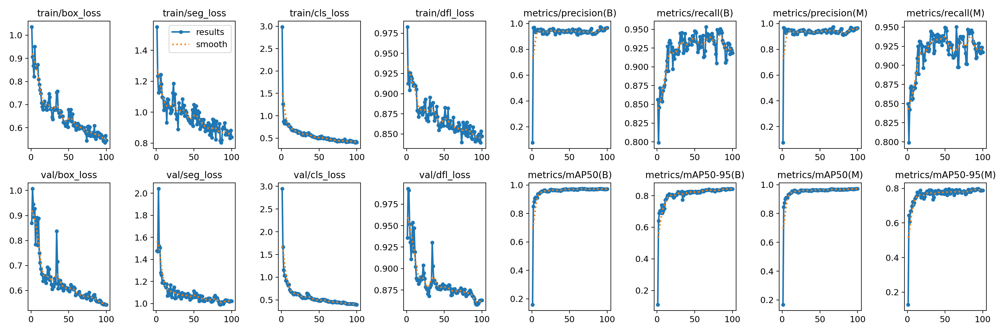

In [ ]:
Image("/content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/results.png")

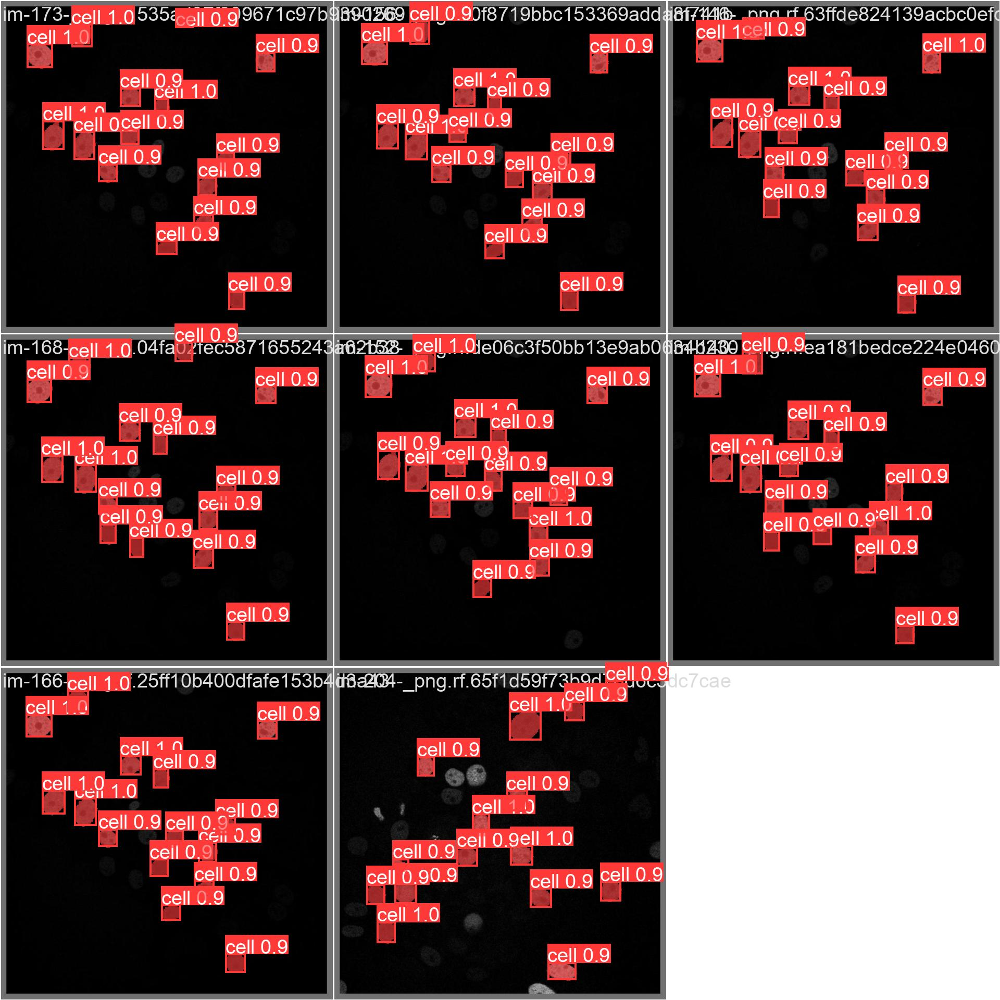

In [ ]:
Image(filename='/content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/val_batch1_pred.jpg', width=900)

**Run inference**

Now that our model is trained, we can use it for inference.

In [ ]:
#List the saved models in 'runs' directory. Note that you will see multiple 'train' subdirectories numbered 1, 2, 3, etc. The exact number depends on the number of epochs.
%ls /content/drive/MyDrive/tp_img_medic/results/200_epochs-/weights

best.pt  last.pt


You can load the best model or the latest. I am picking the latest.

In [ ]:
my_new_model = YOLO('/content/drive/MyDrive/segmentation.v1i.yolov8/results/200_epochs-/weights/last.pt')

Load an image and perform inference (segmentation).

In [ ]:
new_image = '/content/drive/MyDrive/segmentation.v1i.yolov8/test/images/im-112-_png.rf.04fd30ff2b71f67b19ed2a9fa10f3df5.jpg'
new_results = my_new_model.predict(new_image, conf=0.2)  #Adjust conf threshold



image 1/1 /content/drive/MyDrive/segmentation.v1i.yolov8/test/images/im-112-_png.rf.04fd30ff2b71f67b19ed2a9fa10f3df5.jpg: 800x800 26 cells, 15.8ms
Speed: 34.9ms preprocess, 15.8ms inference, 1245.9ms postprocess per image at shape (1, 3, 800, 800)


The results are stored in a variable 'new_results'. Since we only have one image for segmentation, we will only have one set of results. Therefore, let us work with that one result.

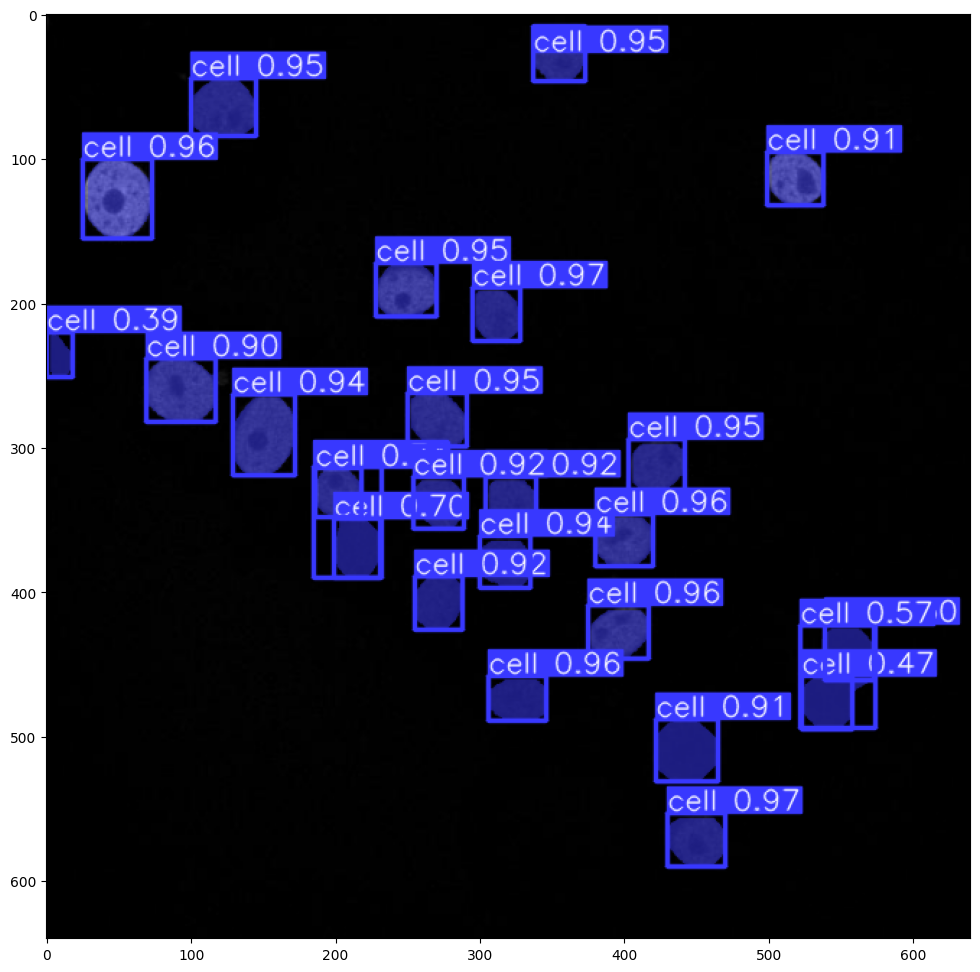

In [ ]:
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

**Extracting bounding boxes and segmented masks from the result**

In [ ]:
new_result = new_results[0]

In [ ]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'cell'}
orig_img: array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
o

**Extracting bounding polygons** <p>
Use 'Masks.xyn' for segments (normalized) and 'Masks.xy' for segments (pixels)

In [ ]:
new_result.masks.xyn

[array([[    0.63125,       0.685],
        [       0.63,     0.68625],
        [    0.62875,     0.68625],
        [    0.62875,      0.6875],
        [     0.6275,     0.68875],
        [    0.62625,     0.68875],
        [      0.625,        0.69],
        [     0.6225,        0.69],
        [     0.6175,       0.695],
        [    0.61625,       0.695],
        [      0.615,     0.69625],
        [      0.615,      0.6975],
        [     0.6125,         0.7],
        [    0.61125,         0.7],
        [       0.61,     0.70125],
        [       0.61,      0.7325],
        [     0.6125,       0.735],
        [    0.61375,       0.735],
        [      0.615,     0.73625],
        [      0.615,      0.7375],
        [    0.61625,     0.73875],
        [     0.6425,     0.73875],
        [      0.645,     0.73625],
        [    0.64625,     0.73625],
        [     0.6475,       0.735],
        [    0.64875,       0.735],
        [       0.65,     0.73375],
        [    0.65125,     0.

**Extracting segmented masks**

In [ ]:
extracted_masks = new_result.masks.data

In [ ]:
extracted_masks.shape

torch.Size([22, 800, 800])

Push the mask to cpu (from GPU) and convert to numpy array for easy plotting.

In [ ]:
masks_array = extracted_masks.cpu().numpy()

In [ ]:
plt.imshow(masks_array[9])

IndexError: ignored

**Extracting labels for each class**

In [ ]:
class_names = new_result.names.values()
class_names

dict_values(['cell'])

In [ ]:
# Extract the boxes, which likely contain class IDs
detected_boxes = new_result.boxes.data
# Extract class IDs from the detected boxes
class_labels = detected_boxes[:, -1].int().tolist()
# Initialize a dictionary to hold masks by class
masks_by_class = {name: [] for name in new_result.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks, class_labels):
    class_name = new_result.names[class_id]  # Map class ID to class name
    masks_by_class[class_name].append(mask.cpu().numpy())

In [ ]:
for class_name, masks in masks_by_class.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")


Class Name: cell, Number of Masks: 22


**Extracting masks for a specific class**

In [ ]:
#alpha_granule_masks = masks_by_class['Alpha']
cell_masks = masks_by_class['Cell']

KeyError: ignored

In [ ]:
# Extract the original image
orig_img = new_result.orig_img

In [ ]:
orig_img.shape

(640, 640, 3)

NameError: ignored

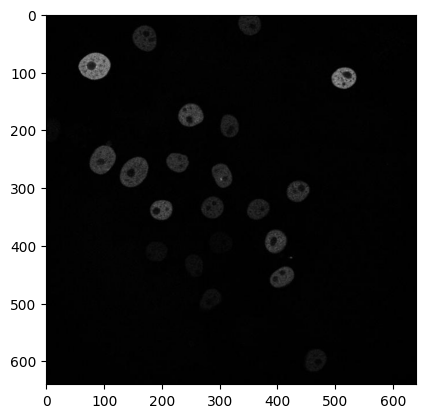

In [ ]:
# Display the original image
plt.imshow(orig_img, cmap='gray')

# Overlay the mask with some transparency
#plt.imshow(alpha_granule_masks[1], cmap='jet', alpha=0.3)
plt.imshow(cell_masks[4], cmap='jet', alpha=0.3)
plt.axis('off') # Turn off axis labels
plt.show()

**Calculating region properties for all objects and saving to a csv file.**

In [ ]:
import pandas as pd
from skimage.measure import regionprops

# Initialize a list to store the properties
props_list = []

# Iterate through all classes
for class_name, masks in masks_by_class.items():
    # Iterate through the masks for this class
    for mask in masks:
        # Convert the mask to an integer type if it's not already
        mask = mask.astype(int)

        # Apply regionprops to the mask
        props = regionprops(mask)

        # Extract the properties you want (e.g., area, perimeter) and add them to the list
        for prop in props:
            area = prop.area
            perimeter = prop.perimeter
            # Add other properties as needed

            # Append the properties and class name to the list
            props_list.append({'Class Name': class_name, 'Area': area, 'Perimeter': perimeter})

# Convert the list of dictionaries to a DataFrame
props_df = pd.DataFrame(props_list)

# Now props_df contains the properties and class names for all regions

# Save the DataFrame to a CSV file
props_df.to_csv('/content/drive/MyDrive/ColabNotebooks/data/3D-EM-Platelet/YOLOv8_object_properties.csv', index=False)

OSError: ignored

In [ ]:
props_df

,Class Name,Area,Perimeter
0,Alpha,2007,173.438600
1,Alpha,541,86.284271
2,Alpha,2604,195.681241
3,Alpha,1336,135.982756
4,Alpha,1039,119.840620
...,...,...,...
139,Vessels,228,59.556349
140,Vessels,145,44.142136
141,Vessels,161,47.798990
142,Vessels,85,31.899495


**Plotting results**

In [ ]:
import seaborn as sns


**Swarm plot**

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 44.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 80.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 55.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 84.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


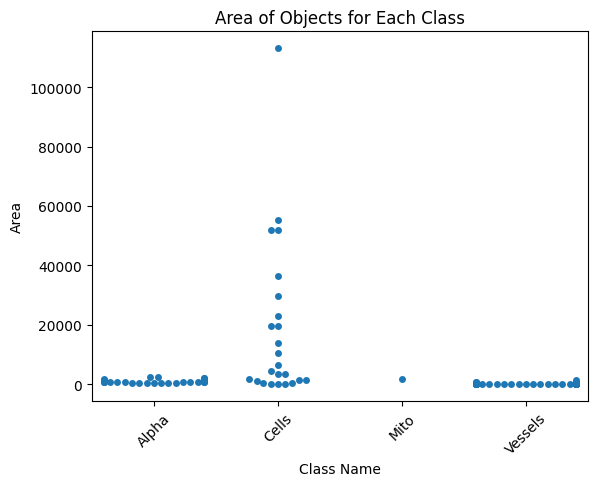

In [ ]:

# Create the swarm plot with Seaborn
sns.swarmplot(x='Class Name', y='Area', data=props_df)

# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Box Plot**

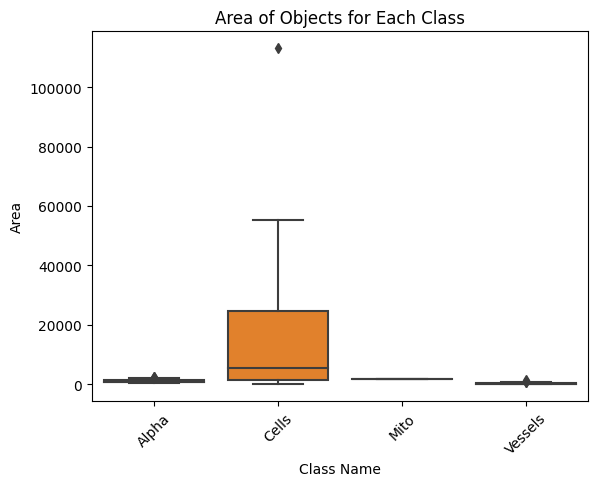

In [ ]:
sns.boxplot(x='Class Name', y='Area', data=props_df)
# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Export model to ONNX for deployment.**

In [ ]:
# Export the model
my_new_model.export(format='onnx', imgsz=[800,800])
